# NYPD Arrests API

This notebook will explore and clean the arrest data from the NYC open data portal. 

In [1]:
import requests
import json
import pandas as pd
import geopandas as gpd

In [2]:
r = requests.get('https://data.cityofnewyork.us/resource/uip8-fykc.json')
type(r.text)
print(r.text)

[{"arrest_key":"238013474","arrest_date":"2021-12-18T00:00:00.000","pd_cd":"157","pd_desc":"RAPE 1","ky_cd":"104.0","ofns_desc":"RAPE","law_code":"PL 1303501","law_cat_cd":"F","arrest_boro":"Q","arrest_precinct":"105","jurisdiction_code":"97","age_group":"18-24","perp_sex":"M","perp_race":"BLACK","x_coord_cd":"1057636","y_coord_cd":"203954","latitude":"40.72618713000002","longitude":"-73.73523390399998","geocoded_column":{"type":"Point","coordinates":[-73.73523390399998,40.72618713000002]},":@computed_region_f5dn_yrer":"63",":@computed_region_yeji_bk3q":"3",":@computed_region_92fq_4b7q":"16",":@computed_region_sbqj_enih":"63",":@computed_region_efsh_h5xi":"24337"}
,{"arrest_key":"236943583","arrest_date":"2021-11-25T00:00:00.000","pd_cd":"263","pd_desc":"ARSON 2,3,4","ky_cd":"114.0","ofns_desc":"ARSON","law_code":"PL 1501500","law_cat_cd":"F","arrest_boro":"K","arrest_precinct":"69","jurisdiction_code":"71","age_group":"25-44","perp_sex":"M","perp_race":"BLACK","x_coord_cd":"1014340","

In [3]:
arrests = r.json()
type(arrests)

list

In [4]:
arrests[:5]

[{'arrest_key': '238013474',
  'arrest_date': '2021-12-18T00:00:00.000',
  'pd_cd': '157',
  'pd_desc': 'RAPE 1',
  'ky_cd': '104.0',
  'ofns_desc': 'RAPE',
  'law_code': 'PL 1303501',
  'law_cat_cd': 'F',
  'arrest_boro': 'Q',
  'arrest_precinct': '105',
  'jurisdiction_code': '97',
  'age_group': '18-24',
  'perp_sex': 'M',
  'perp_race': 'BLACK',
  'x_coord_cd': '1057636',
  'y_coord_cd': '203954',
  'latitude': '40.72618713000002',
  'longitude': '-73.73523390399998',
  'geocoded_column': {'type': 'Point',
   'coordinates': [-73.73523390399998, 40.72618713000002]},
  ':@computed_region_f5dn_yrer': '63',
  ':@computed_region_yeji_bk3q': '3',
  ':@computed_region_92fq_4b7q': '16',
  ':@computed_region_sbqj_enih': '63',
  ':@computed_region_efsh_h5xi': '24337'},
 {'arrest_key': '236943583',
  'arrest_date': '2021-11-25T00:00:00.000',
  'pd_cd': '263',
  'pd_desc': 'ARSON 2,3,4',
  'ky_cd': '114.0',
  'ofns_desc': 'ARSON',
  'law_code': 'PL 1501500',
  'law_cat_cd': 'F',
  'arrest_boro

In [5]:
df = pd.DataFrame(arrests[1:], columns=arrests[0])
df

,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,...,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi
0,236943583,2021-11-25T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,K,69,...,1014340,171320,40.63686750900007,-73.89158591899997,"{'type': 'Point', 'coordinates': [-73.89158591...",5,2,8,42,13827
1,234938876,2021-10-14T00:00:00.000,594,OBSCENITY 1,116.0,SEX CRIMES,PL 2631100,F,K,61,...,995244,155739,40.59414516900005,-73.96041495199995,"{'type': 'Point', 'coordinates': [-73.96041495...",32,2,15,36,18183
2,234788259,2021-10-11T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,B,42,...,1009058,239616,40.82433953100008,-73.91036538099996,"{'type': 'Point', 'coordinates': [-73.91036538...",34,5,43,25,10929
3,234188790,2021-09-28T00:00:00.000,578,NaN,NaN,NaN,PL 2223001,M,B,44,...,1005169,246667,40.84370255600004,-73.92439508899997,"{'type': 'Point', 'coordinates': [-73.92439508...",50,5,42,27,10930
4,234117071,2021-09-27T00:00:00.000,157,RAPE 1,104.0,RAPE,PL 1303501,F,K,84,...,989013,192652,40.69546894100006,-73.98282507899995,"{'type': 'Point', 'coordinates': [-73.98282507...",68,2,48,54,16865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,236414460,2021-11-18T00:00:00.000,639,AGGRAVATED HARASSMENT 2,361.0,OFF. AGNST PUB ORD SENSBLTY &,PL 2403002,M,M,25,...,1000598,231062,40.800880893000055,-73.94095380699997,"{'type': 'Point', 'coordinates': [-73.94095380...",7,4,36,16,13093
995,237630578,2021-12-10T00:00:00.000,259,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",351.0,CRIMINAL MISCHIEF & RELATED OF,PL 1450001,M,Q,114,...,1007694,219657,40.76956124200007,-73.91536344699995,"{'type': 'Point', 'coordinates': [-73.91536344...",39,3,4,72,16860
996,236491527,2021-11-19T00:00:00.000,639,AGGRAVATED HARASSMENT 2,361.0,OFF. AGNST PUB ORD SENSBLTY &,PL 2403002,M,Q,114,...,1007694,219657,40.76956124200007,-73.91536344699995,"{'type': 'Point', 'coordinates': [-73.91536344...",39,3,4,72,16860
997,236063609,2021-11-09T00:00:00.000,439,"LARCENY,GRAND FROM OPEN AREAS, UNATTENDED",109.0,GRAND LARCENY,PL 1553004,F,M,18,...,988211,218129,40.765397475000036,-73.98570226399994,"{'type': 'Point', 'coordinates': [-73.98570226...",12,4,10,10,12081


Bring in the arrests from the [NYC open data portal API](https://data.cityofnewyork.us/Public-Safety/NYPD-Arrest-Data-Year-to-Date-/uip8-fykc). API documentation is [here](https://dev.socrata.com/foundry/data.cityofnewyork.us/uip8-fykc).

In [6]:
import json
import pandas as pd
import requests

APIkey = '271mwHpua7pPxdqx1fVAdVTNc'
requestString = 'https://data.cityofnewyork.us/resource/uip8-fykc.json'
r = requests.get(requestString)
d = json.loads(r.text)
arrestdf = d

arrestdf = pd.DataFrame(arrestdf)
arrestdf

,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,...,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi
0,238013474,2021-12-18T00:00:00.000,157,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,...,1057636,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337
1,236943583,2021-11-25T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,K,69,...,1014340,171320,40.63686750900007,-73.89158591899997,"{'type': 'Point', 'coordinates': [-73.89158591...",5,2,8,42,13827
2,234938876,2021-10-14T00:00:00.000,594,OBSCENITY 1,116.0,SEX CRIMES,PL 2631100,F,K,61,...,995244,155739,40.59414516900005,-73.96041495199995,"{'type': 'Point', 'coordinates': [-73.96041495...",32,2,15,36,18183
3,234788259,2021-10-11T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,B,42,...,1009058,239616,40.82433953100008,-73.91036538099996,"{'type': 'Point', 'coordinates': [-73.91036538...",34,5,43,25,10929
4,234188790,2021-09-28T00:00:00.000,578,NaN,NaN,NaN,PL 2223001,M,B,44,...,1005169,246667,40.84370255600004,-73.92439508899997,"{'type': 'Point', 'coordinates': [-73.92439508...",50,5,42,27,10930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,236414460,2021-11-18T00:00:00.000,639,AGGRAVATED HARASSMENT 2,361.0,OFF. AGNST PUB ORD SENSBLTY &,PL 2403002,M,M,25,...,1000598,231062,40.800880893000055,-73.94095380699997,"{'type': 'Point', 'coordinates': [-73.94095380...",7,4,36,16,13093
996,237630578,2021-12-10T00:00:00.000,259,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",351.0,CRIMINAL MISCHIEF & RELATED OF,PL 1450001,M,Q,114,...,1007694,219657,40.76956124200007,-73.91536344699995,"{'type': 'Point', 'coordinates': [-73.91536344...",39,3,4,72,16860
997,236491527,2021-11-19T00:00:00.000,639,AGGRAVATED HARASSMENT 2,361.0,OFF. AGNST PUB ORD SENSBLTY &,PL 2403002,M,Q,114,...,1007694,219657,40.76956124200007,-73.91536344699995,"{'type': 'Point', 'coordinates': [-73.91536344...",39,3,4,72,16860
998,236063609,2021-11-09T00:00:00.000,439,"LARCENY,GRAND FROM OPEN AREAS, UNATTENDED",109.0,GRAND LARCENY,PL 1553004,F,M,18,...,988211,218129,40.765397475000036,-73.98570226399994,"{'type': 'Point', 'coordinates': [-73.98570226...",12,4,10,10,12081


In [7]:
import geopandas as gpd

arrestgdf = gpd.GeoDataFrame(
    arrestdf, geometry=gpd.points_from_xy(arrestdf.longitude, arrestdf.latitude, 
                                          crs='EPSG:4326'))
arrestgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   arrest_key                   1000 non-null   object  
 1   arrest_date                  1000 non-null   object  
 2   pd_cd                        998 non-null    object  
 3   pd_desc                      993 non-null    object  
 4   ky_cd                        993 non-null    object  
 5   ofns_desc                    993 non-null    object  
 6   law_code                     1000 non-null   object  
 7   law_cat_cd                   987 non-null    object  
 8   arrest_boro                  1000 non-null   object  
 9   arrest_precinct              1000 non-null   object  
 10  jurisdiction_code            1000 non-null   object  
 11  age_group                    1000 non-null   object  
 12  perp_sex                     1000 non-null   object  
 

Text(0.5, 1.0, 'NYPD Arrests (First 1000 Records)')

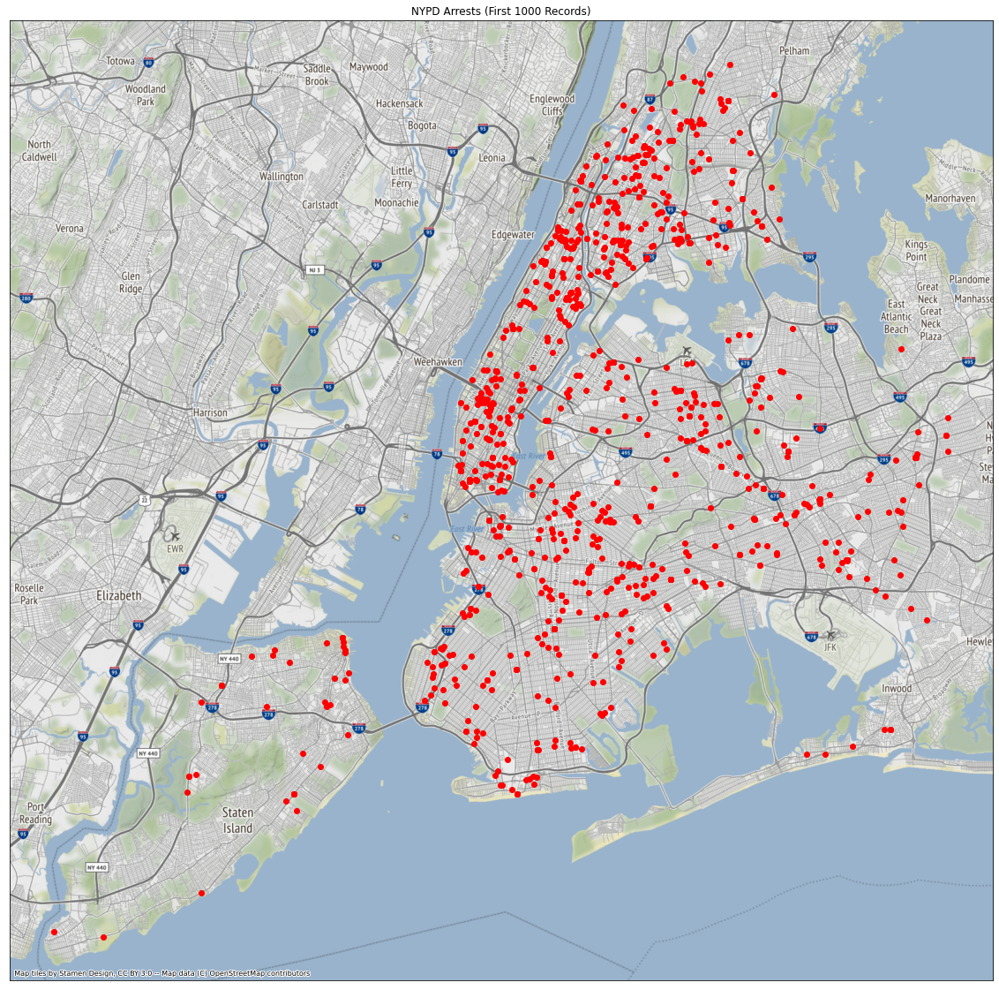

In [8]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create blank figure and axes objects
fig, ax = plt.subplots(figsize=(20,20))
# Plot the data. ax=ax means we plot it on the axes that we just created
arrestgdf.to_crs('EPSG:3857').plot(color='r', ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=12)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])
plt.title("NYPD Arrests (First 1000 Records)")


In [9]:
from sodapy import Socrata

# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
client = Socrata("data.cityofnewyork.us", None)

# Example authenticated client (needed for non-public datasets):
#client = Socrata(data.cityofnewyork.us,
                  #EliseAppToken,
                  #userame="echessman@g.ucla.edu",
                 # password="!viz7H*F9pAEf6y")

# First 10000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("uip8-fykc", limit=157000)

# Convert to pandas DataFrame
results_df = pd.DataFrame.from_records(results)
results_df
results_df.to_pickle('results_df.pandas')

In [10]:
arrest2gdf = gpd.GeoDataFrame(
    results_df, geometry=gpd.points_from_xy(results_df.longitude, results_df.latitude, 
                                          crs='EPSG:4326'))

[]

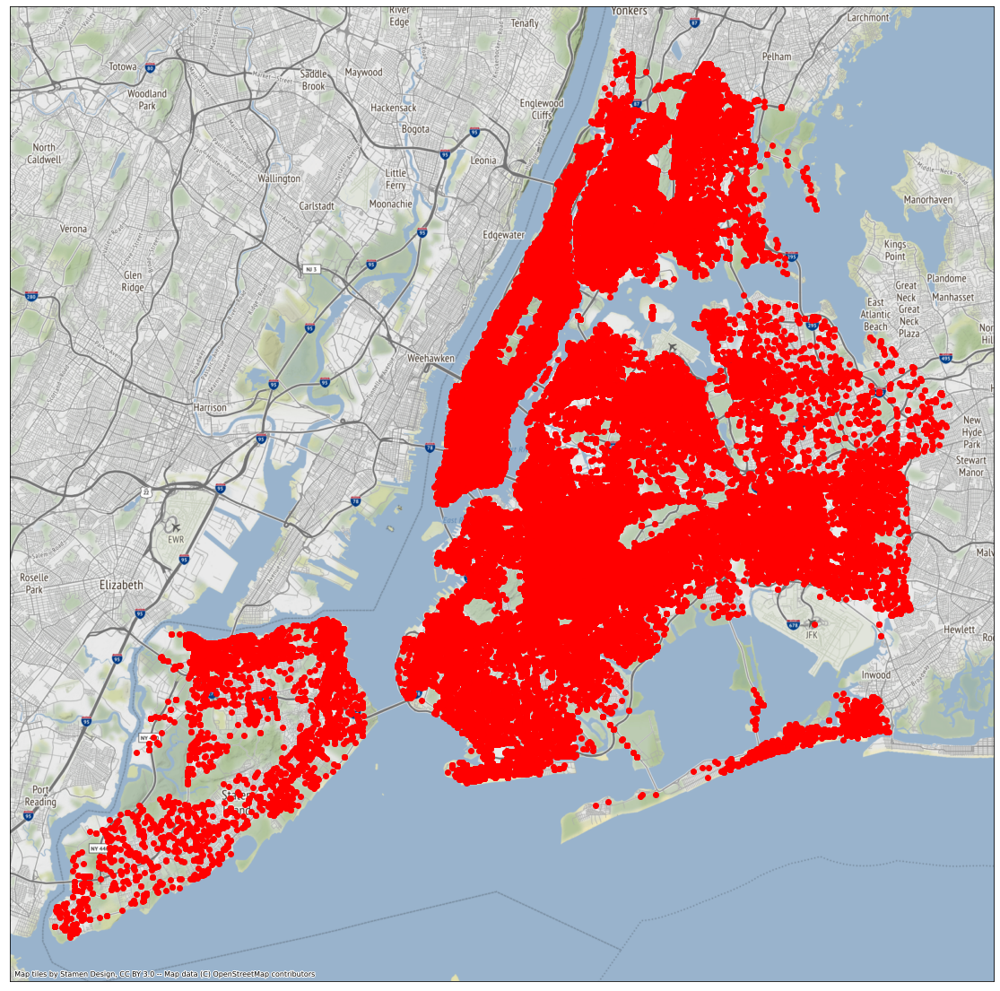

In [11]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create blank figure and axes objects
fig, ax = plt.subplots(figsize=(20,20))
# Plot the data. ax=ax means we plot it on the axes that we just created
arrest2gdf.to_crs('EPSG:3857').plot(color='r', ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=12)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])

In [12]:
pd.set_option('display.max_columns', None)
arrest2gdf

,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,jurisdiction_code,age_group,perp_sex,perp_race,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,geometry
0,238013474,2021-12-18T00:00:00.000,157,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,97,18-24,M,BLACK,1057636,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337,POINT (-73.73523 40.72619)
1,236943583,2021-11-25T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,K,69,71,25-44,M,BLACK,1014340,171320,40.63686750900007,-73.89158591899997,"{'type': 'Point', 'coordinates': [-73.89158591...",5,2,8,42,13827,POINT (-73.89159 40.63687)
2,234938876,2021-10-14T00:00:00.000,594,OBSCENITY 1,116.0,SEX CRIMES,PL 2631100,F,K,61,0,25-44,M,WHITE,995244,155739,40.59414516900005,-73.96041495199995,"{'type': 'Point', 'coordinates': [-73.96041495...",32,2,15,36,18183,POINT (-73.96041 40.59415)
3,234788259,2021-10-11T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,B,42,71,18-24,M,BLACK,1009058,239616,40.82433953100008,-73.91036538099996,"{'type': 'Point', 'coordinates': [-73.91036538...",34,5,43,25,10929,POINT (-73.91037 40.82434)
4,234188790,2021-09-28T00:00:00.000,578,NaN,NaN,NaN,PL 2223001,M,B,44,0,25-44,M,BLACK,1005169,246667,40.84370255600004,-73.92439508899997,"{'type': 'Point', 'coordinates': [-73.92439508...",50,5,42,27,10930,POINT (-73.92440 40.84370)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155502,222884924,2021-01-10T00:00:00.000,397,"ROBBERY,OPEN AREA UNCLASSIFIED",105.0,ROBBERY,PL 1601001,F,B,46,0,45-64,M,BLACK,1011432,247605,40.846260031000035,-73.90175529499999,"{'type': 'Point', 'coordinates': [-73.90175529...",6,5,22,29,10935,POINT (-73.90176 40.84626)
155503,223918625,2021-02-03T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 2650303,F,K,67,0,18-24,M,BLACK,1004940,180941,40.66330200400005,-73.92542497899994,"{'type': 'Point', 'coordinates': [-73.92542497...",61,2,17,40,17614,POINT (-73.92542 40.66330)
155504,224323770,2021-02-13T00:00:00.000,101,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,S,121,0,45-64,M,BLACK,942825,166367,40.623226819000074,-74.14922697299994,"{'type': 'Point', 'coordinates': [-74.14922697...",4,1,13,75,10700,POINT (-74.14923 40.62323)
155505,222599533,2021-01-04T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 2650303,F,K,73,0,25-44,M,BLACK,1007524,188555,40.684194302000044,-73.91608474599997,"{'type': 'Point', 'coordinates': [-73.91608474...",55,2,17,46,13516,POINT (-73.91608 40.68419)


In [13]:
arrest2gdf.ofns_desc.unique().tolist()

['RAPE',
 'ARSON',
 'SEX CRIMES',
 nan,
 'ASSAULT 3 & RELATED OFFENSES',
 'FELONY ASSAULT',
 'DANGEROUS WEAPONS',
 'MISCELLANEOUS PENAL LAW',
 'PETIT LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'DANGEROUS DRUGS',
 'NYS LAWS-UNCLASSIFIED FELONY',
 'GRAND LARCENY',
 'OTHER OFFENSES RELATED TO THEF',
 'PROSTITUTION & RELATED OFFENSES',
 'OFFENSES AGAINST PUBLIC ADMINI',
 'ROBBERY',
 'FOR OTHER AUTHORITIES',
 'CRIMINAL MISCHIEF & RELATED OF',
 'OTHER TRAFFIC INFRACTION',
 'FORGERY',
 'INTOXICATED & IMPAIRED DRIVING',
 'MURDER & NON-NEGL. MANSLAUGHTE',
 'UNAUTHORIZED USE OF A VEHICLE',
 'BURGLARY',
 'OFFENSES INVOLVING FRAUD',
 'VEHICLE AND TRAFFIC LAWS',
 'OFF. AGNST PUB ORD SENSBLTY &',
 'THEFT OF SERVICES',
 'CRIMINAL TRESPASS',
 'POSSESSION OF STOLEN PROPERTY',
 'OTHER STATE LAWS (NON PENAL LA',
 'FRAUDULENT ACCOSTING',
 'OFFENSES AGAINST THE PERSON',
 'FRAUDS',
 'OTHER STATE LAWS',
 'THEFT-FRAUD',
 'INTOXICATED/IMPAIRED DRIVING',
 'GAMBLING',
 'HOMICIDE-NEGLIGENT-VEHICLE',
 'ADMINIST

In [14]:
arrest_by_charge = arrest2gdf.ofns_desc.value_counts().reset_index()
arrest_by_charge

,index,ofns_desc
0,ASSAULT 3 & RELATED OFFENSES,26855
1,FELONY ASSAULT,15579
2,PETIT LARCENY,13178
3,DANGEROUS DRUGS,10450
4,MISCELLANEOUS PENAL LAW,10328
...,...,...
58,PARKING OFFENSES,3
59,ADMINISTRATIVE CODES,2
60,FELONY SEX CRIMES,2
61,KIDNAPPING AND RELATED OFFENSES,1


In [15]:
arrest_by_charge.columns=['charge','count']
arrest_by_charge

,charge,count
0,ASSAULT 3 & RELATED OFFENSES,26855
1,FELONY ASSAULT,15579
2,PETIT LARCENY,13178
3,DANGEROUS DRUGS,10450
4,MISCELLANEOUS PENAL LAW,10328
...,...,...
58,PARKING OFFENSES,3
59,ADMINISTRATIVE CODES,2
60,FELONY SEX CRIMES,2
61,KIDNAPPING AND RELATED OFFENSES,1


In [16]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly
#plotly.tools.set_credentials_file(username='echessman', api_key='bmapr8NX6Okj9F7zXqc8')
import plotly.express as px

# plot the top 20 charges
fig = px.bar(arrest_by_charge.head(20),
       x='charge',
       y='count',
       title='NYPD Arrests by Charge Type')

fig.show()

Now bringing in the [open space data](https://data.cityofnewyork.us/Recreation/Open-Space-Parks-/g84h-jbjm)  from NYC Open Data

In [17]:

APIkey = '271mwHpua7pPxdqx1fVAdVTNc'
requestString = 'https://data.cityofnewyork.us/resource/y6ja-fw4f.json'
s = requests.get(requestString)
p = json.loads(s.text)
parksdf = p

parksdf = pd.DataFrame(parksdf)
parksdf

,park_name,the_geom,feat_code,source_id,sub_code,landuse,parknum,status,shape_leng,shape_area,system
0,Commodore Barry Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4910,21491000001,491050,Community Park,B021,Updated,829.420106841,41539.8013629,NaN
1,Pierrepont Playground,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000002,498000,Neighborhood Park,B222,Unchanged,607.555193338,21960.4949197,NaN
2,Cobble Hill Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000003,498000,Neighborhood Park,B326,Unchanged,784.42199003,28079.0762647,NaN
3,Commodore Barry Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000004,498000,Community Park,B021,Unchanged,2672.71014961,438416.114511,NaN
4,Brooklyn Heights Promenade,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000005,498000,Triangle/Plaza,B223DG,Unchanged,1376.10639843,14465.699799,NaN
...,...,...,...,...,...,...,...,...,...,...,...
995,Idlewild Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,3498000191,498000,Nature Area,Q392,Updated,1707.54155711,102574.103594,NaN
996,Brookville Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,3498000192,498000,Community Park,Q008,Updated,10443.8362996,1142199.36234,NaN
997,Brookville Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,3498000193,498000,Community Park,Q008,Updated,1431.79244986,50708.9454148,NaN
998,Idlewild Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,3498000194,498000,Nature Area,Q392,Updated,1731.88936408,106505.761967,NaN


In [26]:
restString = 'https://data.cityofnewyork.us/resource/y6ja-fw4f.geojson'
parkgdf = gpd.read_file(restString)
parkgdf
parkgdf.to_pickle('parkgdf.pandas')

In [19]:
client2 = Socrata("data.cityofnewyork.us", None)

# Example authenticated client (needed for non-public datasets):
# client = Socrata(data.cityofnewyork.us,
#                  MyAppToken,
#                  userame="user@example.com",
#                  password="AFakePassword")

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results2 = client.get("y6ja-fw4f", limit=2000)

# Convert to pandas DataFrame
results2_df = pd.DataFrame.from_records(results2)
results2_df

,park_name,the_geom,feat_code,source_id,sub_code,landuse,parknum,status,shape_leng,shape_area,system
0,Commodore Barry Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4910,21491000001,491050,Community Park,B021,Updated,829.420106841,41539.8013629,NaN
1,Pierrepont Playground,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000002,498000,Neighborhood Park,B222,Unchanged,607.555193338,21960.4949197,NaN
2,Cobble Hill Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000003,498000,Neighborhood Park,B326,Unchanged,784.42199003,28079.0762647,NaN
3,Commodore Barry Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000004,498000,Community Park,B021,Unchanged,2672.71014961,438416.114511,NaN
4,Brooklyn Heights Promenade,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,21498000005,498000,Triangle/Plaza,B223DG,Unchanged,1376.10639843,14465.699799,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1995,Alley Athletic Playground,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4910,8491000301,491030,NaN,Q001A,Unchanged,137.571842027,1138.20834339,Q001-ZN01-HANDBALL-1530
1996,Alley Athletic Playground,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4910,8491000302,491060,NaN,Q001A,Unchanged,237.727075214,3185.4992498,Q001-ZN01-TENNIS-513
1997,Alley Athletic Playground,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4910,8491000303,491060,NaN,Q001A,Unchanged,245.675951578,3495.68084121,Q001-ZN01-TENNIS-521
1998,Captain Tilly Park,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4980,8498000031,498000,Neighborhood Park,Q052,Updated,2827.26349764,419720.528451,NaN


In [20]:
from shapely import wkt
df['geom'] = gpd.GeoSeries.from_wkt(results2_df['the_geom'])

TypeError: Expected bytes or string, got dict

In [21]:
import geopandas as gpd 
from shapely.geometry import shape

results2_df['the_geom'] = results2_df['the_geom'].apply(shape)
parks_geo = gpd.GeoDataFrame(results2_df).set_geometry('the_geom')
parks_geo

,park_name,the_geom,feat_code,source_id,sub_code,landuse,parknum,status,shape_leng,shape_area,system
0,Commodore Barry Park,"MULTIPOLYGON (((-73.97922 40.69800, -73.97925 ...",4910,21491000001,491050,Community Park,B021,Updated,829.420106841,41539.8013629,NaN
1,Pierrepont Playground,"MULTIPOLYGON (((-73.99732 40.69601, -73.99732 ...",4980,21498000002,498000,Neighborhood Park,B222,Unchanged,607.555193338,21960.4949197,NaN
2,Cobble Hill Park,"MULTIPOLYGON (((-73.99557 40.68793, -73.99557 ...",4980,21498000003,498000,Neighborhood Park,B326,Unchanged,784.42199003,28079.0762647,NaN
3,Commodore Barry Park,"MULTIPOLYGON (((-73.97747 40.69651, -73.97746 ...",4980,21498000004,498000,Community Park,B021,Unchanged,2672.71014961,438416.114511,NaN
4,Brooklyn Heights Promenade,"MULTIPOLYGON (((-73.99747 40.69692, -73.99766 ...",4980,21498000005,498000,Triangle/Plaza,B223DG,Unchanged,1376.10639843,14465.699799,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1995,Alley Athletic Playground,"MULTIPOLYGON (((-73.73771 40.73879, -73.73785 ...",4910,8491000301,491030,NaN,Q001A,Unchanged,137.571842027,1138.20834339,Q001-ZN01-HANDBALL-1530
1996,Alley Athletic Playground,"MULTIPOLYGON (((-73.73736 40.73888, -73.73750 ...",4910,8491000302,491060,NaN,Q001A,Unchanged,237.727075214,3185.4992498,Q001-ZN01-TENNIS-513
1997,Alley Athletic Playground,"MULTIPOLYGON (((-73.73720 40.73891, -73.73736 ...",4910,8491000303,491060,NaN,Q001A,Unchanged,245.675951578,3495.68084121,Q001-ZN01-TENNIS-521
1998,Captain Tilly Park,"MULTIPOLYGON (((-73.79782 40.71204, -73.79802 ...",4980,8498000031,498000,Neighborhood Park,Q052,Updated,2827.26349764,419720.528451,NaN


In [22]:
parks_geo['features'] = parks_geo['the_geom'].apply(lambda x: {'geometry': x, 'properties': {}})
gdf2 = gpd.GeoDataFrame.from_features(parks_geo['features'])

parks_geo = parks_geo.set_geometry(gdf2.geometry)
parks_geo.head()


/Applications/anaconda3/envs/uds/lib/python3.8/site-packages/pandas/core/dtypes/inference.py:383: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/Applications/anaconda3/envs/uds/lib/python3.8/site-packages/pandas/core/dtypes/inference.py:384: ShapelyDeprecationWarning:

__len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.

/Applications/anaconda3/envs/uds/lib/python3.8/site-packages/pandas/io/formats/printing.py:117: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/Applications/anaconda3/envs/uds/lib/python3.8/site-packages/pandas/io/formats/printing.py:121

,park_name,the_geom,feat_code,source_id,sub_code,landuse,parknum,status,shape_leng,shape_area,system,features
0,Commodore Barry Park,"MULTIPOLYGON (((-73.97922 40.69800, -73.97925 ...",4910,21491000001,491050,Community Park,B021,Updated,829.420106841,41539.8013629,NaN,{'geometry': (POLYGON ((-73.97922375065221 40....
1,Pierrepont Playground,"MULTIPOLYGON (((-73.99732 40.69601, -73.99732 ...",4980,21498000002,498000,Neighborhood Park,B222,Unchanged,607.555193338,21960.4949197,NaN,{'geometry': (POLYGON ((-73.99732028095745 40....
2,Cobble Hill Park,"MULTIPOLYGON (((-73.99557 40.68793, -73.99557 ...",4980,21498000003,498000,Neighborhood Park,B326,Unchanged,784.42199003,28079.0762647,NaN,{'geometry': (POLYGON ((-73.9955741991998 40.6...
3,Commodore Barry Park,"MULTIPOLYGON (((-73.97747 40.69651, -73.97746 ...",4980,21498000004,498000,Community Park,B021,Unchanged,2672.71014961,438416.114511,NaN,{'geometry': (POLYGON ((-73.97746661925957 40....
4,Brooklyn Heights Promenade,"MULTIPOLYGON (((-73.99747 40.69692, -73.99766 ...",4980,21498000005,498000,Triangle/Plaza,B223DG,Unchanged,1376.10639843,14465.699799,NaN,{'geometry': (POLYGON ((-73.99746719287955 40....


[]

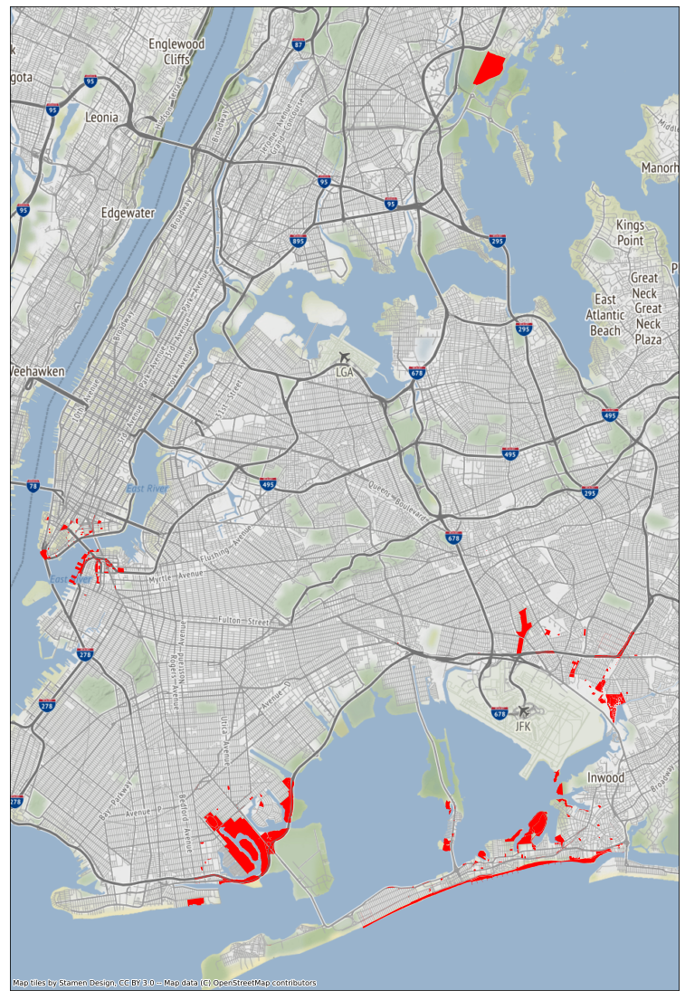

In [28]:
fig, ax = plt.subplots(figsize=(20,20))
# Plot the data. ax=ax means we plot it on the axes that we just created
parkgdf.to_crs('EPSG:3857').plot(color='r', ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=12)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])

Brought in [this park data](https://data.cityofnewyork.us/City-Government/Parks-Zones/4j29-i5ry) instead, seems to look a bit nicer.

In [39]:
restString = 'https://data.cityofnewyork.us/resource/4j29-i5ry.geojson'
park2gdf = gpd.read_file(restString)
park2gdf
park2gdf.to_pickle('GOODparkgdf2.pandas')


Text(0.5, 1.0, 'NYC Parks')

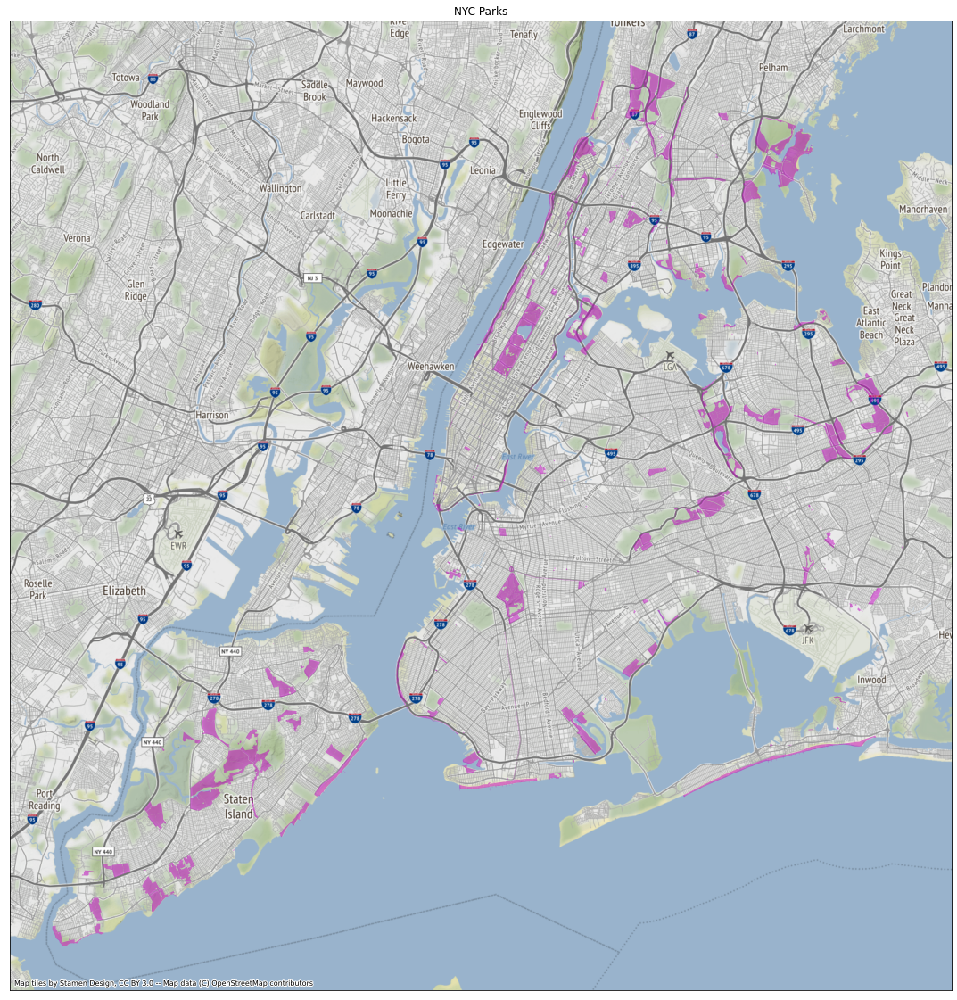

In [42]:
fig, ax = plt.subplots(figsize=(20,20))
# Plot the data. ax=ax means we plot it on the axes that we just created
park2gdf.to_crs('EPSG:3857').plot(color='m', alpha=0.5, ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=12)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])
plt.title("NYC Parks")